(C) Gerold Baier, University College London, 2025

# Model of N Coupled E-I Oscillators with pink noise


## Import

In [1]:
from scipy.integrate import odeint
from scipy.signal import find_peaks, butter, sosfilt
from scipy.fft import rfft, rfftfreq, irfft

from numpy import zeros, ones, tanh, mod, gradient, linspace, sign, log, meshgrid, sort, pi, exp, array, around, arange
from numpy import sqrt, fill_diagonal, ndarray, amax, amin, where, c_, histogram, complex128, flip, ravel_multi_index

from numpy.random import uniform, default_rng, normal, seed, randn, rand

from matplotlib.pyplot import subplots

import sk_dsp_comm.sigsys as ss


## Model and Functions

## The N-variable neural population oscillator

The two populations' temporal dynamics with inhibitory internal coupling is described by two first-order nonlinear differential equations:

$$ \frac{dEx}{dt}      = (h_{ex}      - Ex    - c_2*sigmoid(In) + c_{EE}*\sum_{n=1}^{N} *sigmoid(Ex_n))*\tau_{ex} + pert$$
$$ \frac{dIn}{dt} \,\, = (h_{in} \,\, - In \, - c_4*sigmoid(In) + c_{EI}*\sum_{n=1}^{N} *sigmoid(Ex_n))*\tau_{in} $$

$Ex$ and $In$ are time-dependant variables representing the excitatory and inhibitory neural population, respectively.

$h_{ex}$ and $h_{in}$ are model parameters representing constant (external) input to the excitatory and inhibitory population, respectively.

$c_2$ and $c_4$ are parameters that control the internal inhibition of the two populations.

$c_{EE}$ and $c_{EI}$ are the coupling constants of the excitatory coupling matrices. 

$\tau_{ex}$ and $\tau_{in}$ are the poulation time constants.

_pert_ represents an additive external perturbation.

Function _sigmoid_ is the continuous step function, conmputationally implemented as tangens hyperbolicus.

In [2]:
def sigmoid(u):
    return tanh(u)
    
# With noise array
def N_oscillators(y, t, N, h_ex_rand, h_in_rand, 
                        coupling_matrix_EE, coupling_matrix_EI, coupling_strength_EE, coupling_strength_EI, pars, sr, time_stop, pert, pert_osc):

    tau_ex, tau_in, c2, c4 = pars
    
    time_index = int(t*sr)
    
    if time_index >= time_stop*sr:

        dydt = zeros(2*N)
        
        return dydt

    # Separate Variables
    y_ex = y[:-1:2]
    y_in = y[1::2]

    dy_ex, dy_in = zeros(N), zeros(N)
    dydt = zeros(2*N)

    if len(pert) == 0:
        
        for osc in arange(N):
            
            coup_EE = sum(coupling_matrix_EE[:, osc] * y_ex)
            coup_EI = sum(coupling_matrix_EI[:, osc] * y_ex)
                
            dy_ex[osc] = (h_ex_rand[osc] - y_ex[osc] - c2*sigmoid(y_in[osc]) + 
                          coupling_strength_EE*sigmoid(coup_EE))*tau_ex 
            dy_in[osc] = (h_in_rand[osc] - y_in[osc] - c4*sigmoid(y_in[osc]) + 
                          coupling_strength_EI*sigmoid(coup_EI))*tau_in
            
    else:

        for osc in arange(N):

            if osc == pert_osc:
            
                coup_EE = sum(coupling_matrix_EE[:, osc] * y_ex)
                coup_EI = sum(coupling_matrix_EI[:, osc] * y_ex)
                    
                dy_ex[osc] = (pert[time_index] - y_ex[osc] - c2*sigmoid(y_in[osc]) + 
                              coupling_strength_EE*sigmoid(coup_EE))*tau_ex 
                dy_in[osc] = (h_in_rand[osc]   - y_in[osc] - c4*sigmoid(y_in[osc]) + 
                              coupling_strength_EI*sigmoid(coup_EI))*tau_in

            else:

                coup_EE = sum(coupling_matrix_EE[:, osc] * y_ex)
                coup_EI = sum(coupling_matrix_EI[:, osc] * y_ex)
                    
                dy_ex[osc] = (h_ex_rand[osc] - y_ex[osc] - c2*sigmoid(y_in[osc]) + 
                              coupling_strength_EE*sigmoid(coup_EE))*tau_ex 
                dy_in[osc] = (h_in_rand[osc] - y_in[osc] - c4*sigmoid(y_in[osc]) + 
                              coupling_strength_EI*sigmoid(coup_EI))*tau_in


    # Combine Variables
    dydt[:-1:2] = dy_ex
    dydt[1: :2] = dy_in

    return dydt


In [3]:
def plot_series(time, data, time_begin, time_end, sr):
    
    N = data.shape[1]//2
    
    name_vars = ('Ex_', 'In_')

    no_vars = len(name_vars)

    if N == 1:

        fig, ax = subplots(ncols=len(name_vars), figsize=(8, 6))

        for ind in arange(no_vars):

            ax[ind].plot(time[time_begin*sr:time_end*sr], data[time_begin*sr:time_end*sr, ind], linewidth=2, c='b')
            ax[ind].set_xticks(linspace(0, (time_end-time_begin)*sr, 5));
            ax[ind].set_xticklabels([]);
            ax[ind].set_xlabel('Time', fontsize=14);
            ax[ind].set_ylabel(name_vars[ind], fontsize=14)
            y_min, y_max = ax[ind].get_ylim()
            ax[ind].set_yticks(linspace(y_min, y_max, 3));
            ax[ind].set_yticklabels(around(linspace(y_min, y_max, 3),1), fontsize=14);

    else:

        y_max1 = amax(data[:, arange(0, 2*N, 2)])

        if y_max1 > 0:

            y_max1_ax = 1.1*y_max1

        else:

            y_max1_ax = 0.9*y_max1


        y_min1 = amin(data[:, arange(0, 2*N, 2)])

        if y_min1 > 0:

            y_min1_ax = 0.9*y_min1

        else:

            y_min1_ax = 1.1*y_min1


        y_max2 = amax(data[:, arange(1, 2*N+1, 2)])

        if y_mx2 > 0:

            y_max2_ax = 1.1*y_max2

        else:

            y_max2_ax = 0.9*y_max2   


        y_min2 = amin(data[:, arange(1, 2*N+1, 2)])

        if y_min2 > 0:

            y_min2_ax = 0.9*y_min2

        else:

            y_min2_ax = 1.1*y_min2


        fig, ax = subplots(ncols=len(name_vars), nrows=N, figsize=(10, 6))

        for osc in arange(N):
            for ind in arange(2):

                if ind == 0:
                    ax[osc, ind].plot(time[time_begin*sr:time_end*sr], data[time_begin*sr:time_end*sr, 2*osc+ind], linewidth=1, c='b')
                    ax[osc, ind].set_xticklabels([]);
                    ax[osc, ind].set_ylim(y_min1_ax, y_max1_ax)   
                    ax[osc, ind].set_yticks(linspace(y_min1_ax, y_max1_ax, 3));
                    ax[osc, ind].set_yticklabels(around(linspace(y_min1_ax, y_max1_ax, 3),1), fontsize=14);

                elif ind == 1:
                    ax[osc, ind].plot(time[time_begin*sr:time_end*sr], data[time_begin*sr:time_end*sr, 2*osc+ind], linewidth=1, c='r')
                    
                    ax[osc, ind].set_xticklabels([]);
                    ax[osc, ind].set_ylim(y_min2_ax, y_max2_ax)
                    ax[osc, ind].set_yticks(linspace(y_min2_ax, y_max2_ax, 3));
                    ax[osc, ind].set_yticklabels(around(linspace(y_min2_ax, y_max2_ax, 3),1), fontsize=14);

                if osc == N-1:

                    ax[N-1, ind].set_xlabel('Time', fontsize=14);
                    # print(time[time_begin*sr:time_end*sr].size)
                    # print((time_end-time_begin)*sr)
                    ax[N-1, ind].set_xticks(linspace(time_begin, time_end, 5));
                    ax[N-1, ind].set_xticklabels(linspace(time_begin, time_end, 5));

                label_text = name_vars[ind] + str(osc+1)

                ax[osc, ind].set_ylabel(label_text, fontsize=14)

    fig.tight_layout()
    
    return fig, ax

def generate_multivariate_pink_noise(n_samples, n_series, random_seed=None):
    if random_seed is not None:
        seed(random_seed)

    # Frequencies (half-spectrum)
    freqs = rfftfreq(n_samples)
    freqs[0] = freqs[1]  # Avoid division by zero at DC

    n_freqs = len(freqs)

    # Allocate array for frequency domain data (complex)
    spectrum = zeros((n_freqs, n_series), dtype=complex128)

    # Create scaled random spectra for each series
    for m in range(n_series):
        amplitudes = randn(n_freqs) / sqrt(freqs)
        phases = exp(1j * 2 * pi * rand(n_freqs))
        spectrum[:, m] = amplitudes * phases

    # Inverse FFT to get time-domain pink noise
    pink = irfft(spectrum, n=n_samples, axis=0)

    # Normalize each series to zero mean and unit variance
    pink -= pink.mean(axis=0)
    pink /= pink.std(axis=0)

    return pink  # shape (n_samples, n_series)

def create_sparse_coupling_matrix(N):
    """
    Create a sparse coupling matrix for better memory efficiency.
    """
    from scipy import sparse

    rows, cols = int(N**(1/2)), int(N**(1/2))

    n = rows * cols
    row_indices = []
    col_indices = []
    
    for i in range(rows):
        for j in range(cols):
            current_idx = i * cols + j
            
            # Right neighbor
            if j < cols - 1:
                right_idx = i * cols + (j + 1)
                row_indices.extend([current_idx, right_idx])
                col_indices.extend([right_idx, current_idx])
            
            # Bottom neighbor
            if i < rows - 1:
                bottom_idx = (i + 1) * cols + j
                row_indices.extend([current_idx, bottom_idx])
                col_indices.extend([bottom_idx, current_idx])
    
    # Create sparse matrix
    data = ones(len(row_indices), dtype=int)
    coupling_matrix = sparse.csr_matrix((data, (row_indices, col_indices)), shape=(n, n))
    
    return coupling_matrix.toarray()  # Convert to dense for visualization


## Time Series with Periodic Perturbation

In [129]:
# Number of oscillators
N = 49

rows, cols = int(N**(1/2)), int(N**(1/2))

# Excitatory input parameter
h_ex_0 = -6.35
h_in_0 = -4.0

eps          = 0.01
RANDOM_STATE = 11111
seed(RANDOM_STATE)
random_vals        = eps*normal(0,1,size=N)
random_vals_sorted = sort(random_vals)
h_ex_rand = h_ex_0 - random_vals_sorted
h_in_rand = h_in_0 - eps*normal(0,1,size=N)

h_centre_index = ravel_multi_index(((rows-1)//2, (cols-1)//2), (rows, cols))

h_ex_rand[h_centre_index] = h_ex_0

# Parameters

pars = (1, 1.5, 10, 0) # Slow Homoclinic
# pars = (1, 1, 10, 0) # Fast SNIC
# t_ex, t_in, c2, c4

coupling_strength_EE, coupling_strength_EI = 5., 10.

frac_EE, frac_EI = 0.26, 0.0

# Coupling
coupling_matrix_EE_ini = create_sparse_coupling_matrix(N)
coupling_matrix_EI_ini = coupling_matrix_EE_ini.copy()

coupling_matrix_EE = coupling_matrix_EE_ini*frac_EE
coupling_matrix_EI = coupling_matrix_EI_ini*frac_EI

fill_diagonal(coupling_matrix_EE, 1)
fill_diagonal(coupling_matrix_EI, 1)

# Time array
time_stop = 20
sr        = 1000
samples   = time_stop*sr
time      = linspace(start=0, stop=time_stop, num=samples)

freq      = 0.3
pulse_wid = 1.3
pulse_amp = 6.0

# Initial conditions:
# y_ini = normal(size=2*N)*0.1
y_ini = y_pert[-1, :]

pert      = h_ex_0 + pulse_amp*ss.rect(mod(time, 1/freq)-(1/freq)/2-pulse_wid/2, pulse_wid)

pert_osc  = h_centre_index

y_pert    = odeint(func=N_oscillators, y0=y_ini, t=time, 
                args=(N, h_ex_rand, h_in_rand,  
                    coupling_matrix_EE, 
                    coupling_matrix_EI, 
                    coupling_strength_EE, 
                    coupling_strength_EI, 
                    pars, sr, time_stop, pert, pert_osc), 
                hmax=0.1)

print('Complete')


Complete


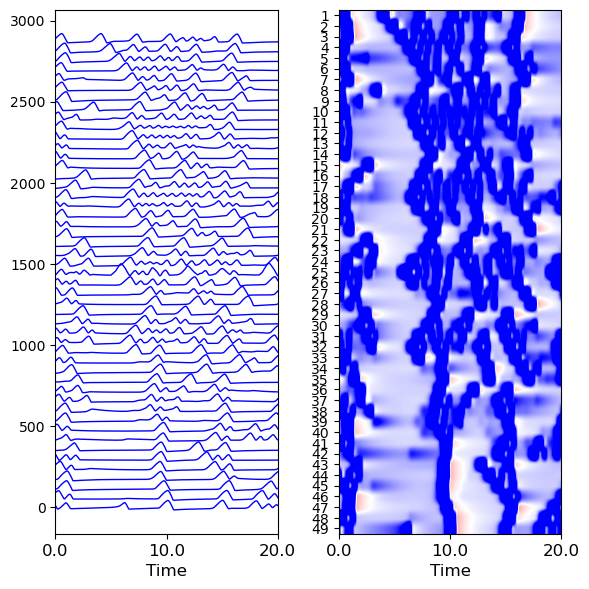

In [130]:
y_unfiltered = y_pert[:,::2]

start, stop = 0, y_pert.shape[0]

offset = 60

vmin, vmax = -3., -0

###################################################
fig, ax = subplots(nrows=1, ncols=2, figsize=(6, 6))

ax[0].plot(10*y_unfiltered[start:stop, :] + offset*arange(N-1,-1,-1), 
        linewidth=1, color='b');
# ax[0].set_yticks(offset*arange(N))
# ax[0].set_yticklabels(flip(arange(N))+1)
ax[0].margins(x=0)
ax[0].set_xticks(linspace(0, stop-start, 3))
labl = linspace(start/sr, stop/sr, 3)
ax[0].set_xticklabels(labl, fontsize=12)
ax[0].set_xlabel('Time', fontsize=12)


ax[1].imshow(y_unfiltered[start:stop, :].T, aspect='auto', 
          cmap='bwr_r', vmin=vmin, vmax=vmax);
ax[1].set_xticks(linspace(0, stop-start, 3))
labl = linspace(start/sr, stop/sr, 3)
ax[1].set_xticklabels(labl, fontsize=12)
ax[1].set_xlabel('Time', fontsize=12)
ax[1].set_yticks(arange(y_unfiltered.shape[1]));
ax[1].set_yticklabels(arange(y_unfiltered.shape[1])+1);

fig.tight_layout()


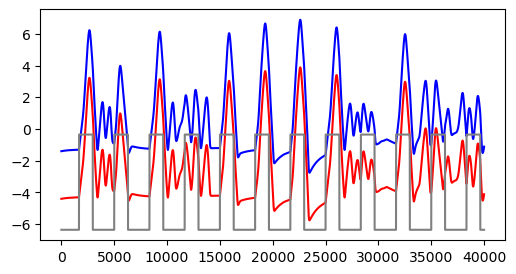

In [128]:
fig, ax = subplots(figsize=(6, 3))

ax.plot(y_unfiltered[:, h_centre_index], c='b');
ax.plot(y_unfiltered[:, h_centre_index]-3, c='r');

ax.plot(pert, c='gray');

In [131]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def animate_heatmap_3d(data, title="Time-dependent Heatmap", cmap='viridis', interval=100):
    """
    Animate a 3D array as a time-dependent heatmap.
    
    Parameters:
    data: 3D numpy array of shape (rows, cols, time_steps)
    title: plot title
    cmap: colormap
    interval: delay between frames in milliseconds
    """
    rows, cols, time_steps = data.shape
    
    fig, ax = plt.subplots(figsize=(5, 5))
    
    # Initial frame
    im = ax.imshow(data[:, :, 0], cmap=cmap, aspect='equal', interpolation='Gaussian')
    ax.set_title(f"{title} - Time: 0")
    plt.colorbar(im, ax=ax, shrink=0.5)
    
    def update(frame):
        im.set_data(data[:, :, frame])
        ax.set_title(f"{title} - Time: {frame}")
        return [im]
    
    anim = FuncAnimation(fig, update, frames=time_steps, 
                        interval=interval, blit=True)
    
    plt.close()  # Prevent double display
    return HTML(anim.to_jshtml())

# Animate it
data = y_unfiltered.reshape(time_stop*sr, rows, cols).transpose()

animate_heatmap_3d(data[:, :, ::100], "Coupled Cells Simulation", cmap='hot')